# <font color="#114b98">Phase 2 : Problème de ML sur des données réelles d'Open Food Fact</font>


Nous allons dans un premier temps **traiter le jeu de données afin de repérer des variables pertinentes** pour les traitements à venir et **automatiser ces traitements** pour éviter de répéter ces opérations.

## <font color="#00afe6">Sommaire</font>
[1.1. Colonnes et lignes vides / Doublons](#section_1)     
[1.2. Variables redondantes](#section_2)     
[1.3. Les pays de l'analyse](#section_3)     
[1.4. Les catégories de produits](#section_4)          
[1.5. Compléter les valeurs manquantes ou aberrantes](#section_5)     
[1.6. Calcul des Nutri-Scores manquants](#section_6)     

## <font color="#00afe6">1. Nettoyage des données</font>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Le jeu de données téléchargé en CSV sur le site [Open Food Facts](https://world.openfoodfacts.org/) est importé dans le Notebook via la méthode `read_csv` de la librairie `pandas`

In [2]:
from data_loader import read_config, get_data

data = get_data(file_path = "../data/df_withoutduplicatefeatures4.csv")
print(f"data set shape is {data.shape}") 

Reading dataset ...
data set shape is (2830755, 165)


In [3]:
datas = data

In [4]:
print ("Le dataset compte {} lignes et {} variables".format(datas.shape[0], datas.shape[1]))

Le dataset compte 2830755 lignes et 165 variables


### <font color="#ea1c60" id="section_1">1.1. Colonnes et lignes vides / Doublons</font>
Regardons à présent les **variables qui comptent le plus de valeurs null**:

In [5]:
def null_factor(df, tx_threshold=50):
  null_rate = ((datas.isnull().sum() / datas.shape[0])*100).sort_values(ascending=False).reset_index()
  null_rate.columns = ['Variable','Taux_de_Null']
  high_null_rate = null_rate[null_rate.Taux_de_Null >= tx_threshold]
  return high_null_rate

In [6]:
full_null_rate = null_factor(datas, 100)
full_null_rate

,Variable,Taux_de_Null


Il n'y a pas de variable n'ayant que des valeurs null.<br>
Nous allons regarder le taux de remplissage des variables graphiquement et fixer un **seuil de suppression à 25% de taux de remplissage** :

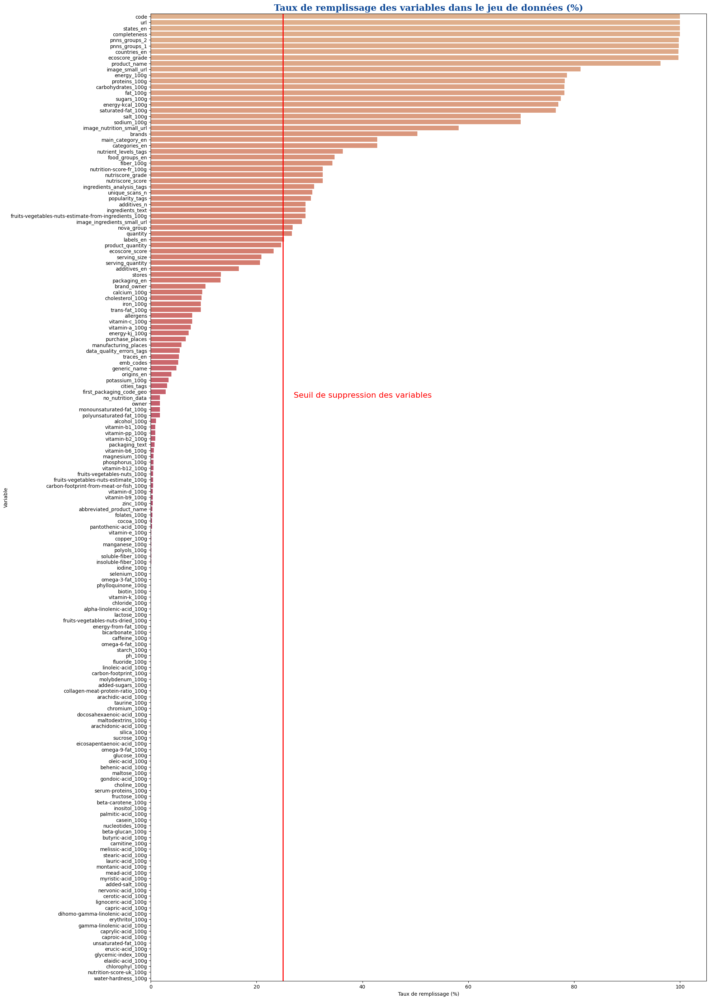

In [7]:
filling_features = null_factor(datas, 0)
filling_features["Taux_de_Null"] = 100-filling_features["Taux_de_Null"]
filling_features = filling_features.sort_values("Taux_de_Null", ascending=False) 

#Seuil de suppression
sup_threshold = 25

fig = plt.figure(figsize=(20, 35))

font_title = {'family': 'serif',
              'color':  '#114b98',
              'weight': 'bold',
              'size': 18,
             }

sns.barplot(x="Taux_de_Null", y="Variable", data=filling_features, palette="flare")
#Seuil pour suppression des varaibles
plt.axvline(x=sup_threshold, linewidth=2, color = 'r')
plt.text(sup_threshold+2, 65, 'Seuil de suppression des variables', fontsize = 16, color = 'r')

plt.title("Taux de remplissage des variables dans le jeu de données (%)", fontdict=font_title)
plt.xlabel("Taux de remplissage (%)")
plt.show()

In [8]:
#Liste des variables à conserver
features_to_conserve = list(filling_features.loc[filling_features['Taux_de_Null']>=sup_threshold, 'Variable'].values)
#Liste des variables supprimées
deleted_features = list(filling_features.loc[filling_features['Taux_de_Null']<sup_threshold, 'Variable'].values)

#Nouveau Dataset avec les variables conservées
#datas = datas[features_to_conserve].sort_values(["created_datetime","last_modified_datetime"], ascending=True)
#datas.sample(5)

In [163]:
features_to_conserve

['code',
 'url',
 'states_en',
 'completeness',
 'pnns_groups_2',
 'pnns_groups_1',
 'countries_en',
 'ecoscore_grade',
 'product_name',
 'image_small_url',
 'energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'fat_100g',
 'sugars_100g',
 'energy-kcal_100g',
 'saturated-fat_100g',
 'salt_100g',
 'sodium_100g',
 'image_nutrition_small_url',
 'brands',
 'main_category_en',
 'categories_en',
 'nutrient_levels_tags',
 'food_groups_en',
 'fiber_100g',
 'nutrition-score-fr_100g',
 'nutriscore_grade',
 'nutriscore_score',
 'ingredients_analysis_tags',
 'unique_scans_n',
 'popularity_tags',
 'additives_n',
 'ingredients_text',
 'fruits-vegetables-nuts-estimate-from-ingredients_100g',
 'image_ingredients_small_url',
 'nova_group',
 'quantity',
 'labels_en']

In [162]:
deleted_features

['product_quantity',
 'ecoscore_score',
 'serving_size',
 'serving_quantity',
 'additives_en',
 'stores',
 'packaging_en',
 'brand_owner',
 'calcium_100g',
 'cholesterol_100g',
 'iron_100g',
 'trans-fat_100g',
 'allergens',
 'vitamin-c_100g',
 'vitamin-a_100g',
 'energy-kj_100g',
 'purchase_places',
 'manufacturing_places',
 'data_quality_errors_tags',
 'traces_en',
 'emb_codes',
 'generic_name',
 'origins_en',
 'potassium_100g',
 'cities_tags',
 'first_packaging_code_geo',
 'no_nutrition_data',
 'owner',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'alcohol_100g',
 'vitamin-b1_100g',
 'vitamin-pp_100g',
 'vitamin-b2_100g',
 'packaging_text',
 'vitamin-b6_100g',
 'magnesium_100g',
 'phosphorus_100g',
 'vitamin-b12_100g',
 'fruits-vegetables-nuts_100g',
 'fruits-vegetables-nuts-estimate_100g',
 'carbon-footprint-from-meat-or-fish_100g',
 'vitamin-d_100g',
 'vitamin-b9_100g',
 'zinc_100g',
 'abbreviated_product_name',
 'folates_100g',
 'cocoa_100g',
 'pantothenic-acid_100g'

De nombreuses features ont un taux de valeurs nulles supérieur à 50%, ce qui représente une très grosse part de données manquantes. **La majeure partie de ces variables ne peuvent pas être recalculées** puisqu'il s'agit de mesures physico-chimiques directes sur les produits. Pour le moment nous allons tous les garder, nous les supprimerons plus tard.

Pour la suite des analyses, nous aurons besoin d'un minimum d'informations sur **les nutriments** des produits. Ces données sont **suffixées avec** `_100g`. Nous allons donc **conserver les lignes pour lesquelles au moins une de ces features est complétée** :

In [9]:
def search_componant(df, suffix='_100g'):
  componant = []
  for col in df.columns:
      if '_100g' in col: componant.append(col)
  df_subset_columns = df[componant]
  return df_subset_columns

In [10]:
df_subset_nutients = search_componant(datas,'_100g')
df_subset_nutients.head()

,energy-kj_100g,energy-kcal_100g,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,...,carbon-footprint-from-meat-or-fish_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,choline_100g,phylloquinone_100g,beta-glucan_100g,inositol_100g,carnitine_100g
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,165.0,690.0,NaN,2.0,2.00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,1.4,0.90,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,57.0,238.0,NaN,0.2,0.10,NaN,NaN,NaN,NaN,...,NaN,-5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,375.0,1569.0,NaN,7.0,3.08,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
print('Lignes nutriments (_100g) vides: {}'.format(df_subset_nutients.isnull().all(axis=1).sum()))

Lignes nutriments (_100g) vides: 474355


In [12]:
datas = datas[df_subset_nutients.notnull().any(axis=1)]
datas.shape

(2356400, 165)

Notre jeu de données est à présent débarassé des lignes (et colonnes) peu complétées. Nous allons à présent **rechercher et supprimer les doublons**.

In [13]:
# Suppression des doublons en fonction du code
datas.drop_duplicates(subset ="code", keep = 'last', inplace=True)

C:\Users\joell\AppData\Local\Temp\ipykernel_6800\2235139470.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datas.drop_duplicates(subset ="code", keep = 'last', inplace=True)


In [14]:
datas[(datas["product_name"].isnull()==False) 
      & (datas["brands"].isnull()==False)].groupby(by=["product_name","brands"])["code"].nunique().sort_values(ascending=False)

product_name                 brands                 
Burger vegetariana           Bonarea                    305
Filet de poulet              La Nouvelle Agriculture    218
Burger vegana                Bonarea                    205
Finísimo de pechuga de pavo  Bonarea                    155
Filet de poulet              Le Gaulois                 146
                                                       ... 
Galette frangipane           Cora                         1
                             Leader Price                 1
                             Match                        1
                             Monoprix                     1
🤬                            🤬                            1
Name: code, Length: 1133879, dtype: int64

In [15]:
datas = datas[(datas["product_name"]!="🤬") 
              & (datas["brands"]!="🤬")]

In [16]:
# Suppression des doublons sur marque et produit en conservant les valeurs nulles
datas = datas[(~datas.duplicated(["product_name","brands"],keep="last")) 
      | ((datas['product_name'].isnull()) & (datas['brands'].isnull()))]

In [17]:
datas.shape

(1877499, 165)

### <font color="#ea1c60" id="section_2">1.2. Variables redondantes ou utiles</font>

Certaines variables dans le dataset sont en réalité des variables redondantes ou pas très pertinentes pour nos analyses. Nous les avons donc supprimé manuellement au préalable. 

C'est par exemple le cas des **variables suffixées par `_tags` ou `_en`** qui ne font que reprendre d'autres features traduites ou simplifiées. Nous avons donc, lorsque la colonne suffixée `_en` existe, supprimer toutes les autres colonnes identiques non suffixées ou contenant `_tags`.

D'autres variables sont également redondantes, comme celles avec les images.

Les variables telles que les dates et noms de contributeurs ont été aussi supprimées car elles ne sont qu'informatives mais pas utiles.

A présent, notre dataset des variables qui ne contienent plus de redondance. Nous allons maintenant nous intéresser à une variable importante : le pays.

### <font color="#ea1c60" id="section_3">1.3. Les pays de l'analyse</font>

Regardons tout d'abord le nombre de pays représentés *(s'il est trop élevé, c'est que des erreurs existent)*

In [18]:
countries = datas.groupby(by="countries_en").nunique()

In [19]:
countries[['code']].head()

,code
countries_en,
123456789,1
Afghanistan,15
"Afghanistan,Belgium,France",2
"Afghanistan,Finland,France,Sweden",1
"Afghanistan,France",115


Plusieurs pays sont regroupés dans la même variable, nous allons devoir effectuer un split du texte pour visualiser tout nos pays :

In [20]:
def split_words(df, column = 'countries_en'):
  list_words = set()
  for word in df[column].str.split(','):
    if isinstance(word, float):
      continue
    list_words = set().union(word, list_words)
  return list(list_words)

In [21]:
#Liste contenant tous les pays du jeu de données (bons ou mauvais)
list_countries = split_words(datas, 'countries_en')

In [22]:
print("Nombre de pays représentés : {}".format(len(list_countries)))

Nombre de pays représentés : 882


Nous allons charger une **base de données des pays, en Anglais**, pour déterminer les pays qui ne matchent pas *(mauvaise orthographe ou autre)*.

In [23]:
df_countries = pd.read_csv("../data/countries-en.csv",
                        sep=",", header=None, index_col = 0).rename(columns={0:"index", 1:"country_id", 2:"country_code_2", 3:"country_code_3", 4:"country_fr", 5:"country_en"})
df_countries.head()

,country_id,country_code_2,country_code_3,country_fr,country_en
0,,,,,
1,4,AF,AFG,Afghanistan,Afghanistan
2,8,AL,ALB,Albanie,Albania
3,10,AQ,ATA,Antarctique,Antarctica
4,12,DZ,DZA,Algérie,Algeria
5,16,AS,ASM,Samoa Américaines,American Samoa


In [24]:
df_countries = pd.merge(pd.DataFrame(list_countries, columns=["countries_dataset"]),df_countries, how="left", 
         left_on="countries_dataset", right_on="country_en")

In [25]:
false_country_list = list(df_countries[df_countries.isnull().sum(axis=1)>0].countries_dataset)
false_country_list[0:15]

['ประเทศอิตาลี',
 'تونس',
 'باقة-جت-زيمر-وضواحيها',
 'fr:francja',
 'de:drutschland',
 'عراق-اربيل-صنايع-كسنزان',
 'Lietuva',
 'Белоруссия',
 'Belgium-france',
 'Https-www-batamnut-com',
 'Sw',
 'de:de-by-70025-eg',
 'fr:polonia',
 'France-spain',
 'fr:polinesia-francesa']

puis nous allons **supprimer ces pays "fantômes" de la base de données** :

In [26]:
for index, countries in datas['countries_en'].str.split(',').items():
  if isinstance(countries, float):
    continue
  country_name = []
  found = False
  for country in countries:
    if country in false_country_list:
      found = True
    else:
      country_name.append(country)
  if found:
    datas.loc[index, 'countries_en'] = ','.join(country_name)

In [27]:
print("Nouveau nombre de pays représentés : {}".format(len(split_words(datas, 'countries_en'))))

Nouveau nombre de pays représentés : 199


Le nombre de pays représenté est à présent plus cohérent et la perte d'informations est limitée. Il nous reste à présent à **compléter les valeurs nulles pour cette variable**.

In [28]:
datas['countries_en'] = np.where((datas['countries_en'].isnull()==True), "unknown", 
                                 np.where(datas['countries_en'] == "", "unknown", datas['countries_en']))

Nous pouvons également regarder quels sont les **pays les plus représentés** :

In [29]:
def top_words(df, column="countries_en", nb_top=10):
    count_keyword = dict()
    df_col = df[column].to_frame(name=column)
    for index, col in df_col.iterrows():
        if isinstance(col[column], float):
            continue
        for word in col[column].split(','):
            if word in count_keyword.keys():
                count_keyword[word] += 1
            else:
                count_keyword[word] = 1

    keyword_top = []
    for k,v in count_keyword.items():
        keyword_top.append([k,v])
    keyword_top.sort(key = lambda x:x[1], reverse = True)

    return keyword_top[:nb_top]

In [30]:
df_top_countries = pd.DataFrame(top_words(df=datas, column="countries_en", nb_top=10), 
                                columns=["Keyword","count"])
df_top_countries

,Keyword,count
0,France,636363
1,United States,433779
2,Spain,184323
3,Italy,146167
4,Germany,127362
5,United Kingdom,65551
6,Switzerland,63312
7,Belgium,55700
8,Canada,51256
9,Ireland,28762


**La France et les Etats-Unis sont massivement représentés** dans le Dataset.

### <font color="#ea1c60" id="section_4">1.4. Les catégories de produits</font>

Intéressons nous à présent à la catégorisation des produits. 5 variables représentent cette catégorisation de manière plus ou moins précise : `categories_en`, `main_category_en`, `pnns_groups_1`, `pnns_groups_2`,`food_groups_en`.

D'abord nous allons passer tout le dataframe en minuscule, supprimer les éventuels préfixes (ex: 'fr:') puis lemmatiser les mots.

In [39]:
datas = datas.applymap(lambda s: s.lower() if type(s) == str else s)

In [55]:
import nltk
from nltk.stem import WordNetLemmatizer
import re

# Créer un objet WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Définir une fonction pour lemmatiser et supprimer les préfixes de langue
def lemmatize_and_remove_prefix(text):
    if isinstance(text, str):
        # Supprimer les préfixes de langue
        text = re.sub(r'\b\w{2}:(\w+)\b', r'\1', text)
        # Remplacer les tirets par un espace
        text = text.replace('-', ' ')
        # Tokenizer le texte
        tokens = nltk.word_tokenize(text)
        # Lemmatiser chaque token
        lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
        # Rejoindre les tokens lemmatisés en une chaîne de caractères
        lemmatized_text = ' '.join(lemmatized_tokens)
        return lemmatized_text
    else:
        # Si la valeur n'est pas une chaîne de caractères, retourner la valeur originale
        return text

In [56]:
# Appliquer la fonction à chaque colonne spécifiée
datas['categories_en'] = datas['categories_en'].apply(lemmatize_and_remove_prefix)
datas['pnns_groups_1'] = datas['pnns_groups_1'].apply(lemmatize_and_remove_prefix)
datas['pnns_groups_2'] = datas['pnns_groups_2'].apply(lemmatize_and_remove_prefix)
datas['main_category_en'] = datas['main_category_en'].apply(lemmatize_and_remove_prefix)
datas['food_groups_en'] = datas['food_groups_en'].apply(lemmatize_and_remove_prefix)

In [57]:
datas[['categories_en','pnns_groups_1','pnns_groups_2','main_category_en','food_groups_en']].sample(10)

,categories_en,pnns_groups_1,pnns_groups_2,main_category_en,food_groups_en
381886,unknown,unknown,unknown,unknown,unknown
1850395,unknown,unknown,unknown,unknown,unknown
1223144,"plant based food and beverage , plant based fo...",sugary snack,sweet,raspberry jam,"sugary snack , sweet"
2399530,unknown,unknown,unknown,unknown,unknown
1584279,"dairy , fermented food , dessert , fermented m...",milk and dairy product,milk and yogurt,flavoured yogurt,"milk and dairy product , milk and yogurt"
894506,unknown,unknown,unknown,unknown,unknown
1801441,"plant based food and beverage , plant based fo...",cereal and potato,breakfast cereal,mixed puffed cereal,"cereal and potato , breakfast cereal"
1563135,"plant based food and beverage , beverage , pla...",beverage,fruit juice,fruit juice,"beverage , fruit juice"
1143009,"fish and meat and egg , foies gras , foies gra...",salty snack,salty and fatty product,whole foies gras from duck,"salty snack , salty and fatty product"
1882749,unknown,unknown,unknown,unknown,unknown


Nous allons regarder le **nombre total de catégories représentées** :

In [58]:
categories = split_words(df = datas, column = 'categories_en')
print("{} catégories sont représentées dans le jeu de données.".format(len(categories)))

51190 catégories sont représentées dans le jeu de données.


Ici également, nous allons regarder les **catégories les plus représentées**, après avoir remplacé les valeurs nulles et complété les valeurs inconnues des pnns avec la catégorie principale :

In [59]:
datas['categories_en'] = np.where((datas['categories_en'].isnull()==True), "unknown", 
                                 np.where(datas['categories_en'] == "", "unknown", datas['categories_en']))
datas['main_category_en'] = np.where((datas['main_category_en'].isnull()==True), "unknown", 
                                 np.where(datas['main_category_en'] == "", "unknown", datas['main_category_en']))
datas['pnns_groups_1'] = np.where((datas['pnns_groups_1'].isnull()==True), "unknown", 
                                 np.where(datas['pnns_groups_1'] == "", "unknown", datas['pnns_groups_1']))
datas['pnns_groups_2'] = np.where((datas['pnns_groups_2'].isnull()==True), "unknown", 
                                 np.where(datas['pnns_groups_2'] == "", "unknown", datas['pnns_groups_2']))
datas['food_groups_en'] = np.where((datas['food_groups_en'].isnull()==True), "unknown", 
                                 np.where(datas['food_groups_en'] == "", "unknown", datas['food_groups_en']))

In [60]:
df_top_categories = pd.DataFrame(top_words(df=datas, column="categories_en", nb_top=10), 
                                 columns=["Keyword","count"])
df_top_categories

,Keyword,count
0,unknown,965782
1,plant based food and beverage,284849
2,plant based food,240401
3,snack,146734
4,sweet snack,133147
5,cereal and potato,91595
6,dairy,82554
7,fermented food,69333
8,meat and their product,67736
9,fermented milk product,66806


Il existe donc également une grande disparité dans les catégories représentées et les "unknown", les catégories inconnues l'emportent. 

Pour une meilleure visualisation, nous allons représenter le top 100 des catégories dans un nuage de mots grâce à la librairie `WordCloud` :

In [72]:
from wordcloud import WordCloud

def plot_world_cloud(df=datas,column="categories_en",nb_top=100):
  fig = plt.figure(1, figsize=(20,15))
  ax1 = fig.add_subplot(1,1,1)

  words = dict()
  trunc_occurences = top_words(df=df, column=column, nb_top=nb_top)
  for s in trunc_occurences:
    words[s[0]] = s[1]

  word_cloud = WordCloud(width=900,height=500, normalize_plurals=False,
                        background_color="white")
  word_cloud.generate_from_frequencies(words)
  ax1.imshow(word_cloud, interpolation="bilinear")
  ax1.axis('off')
  plt.title("Nuage de mots des {} meilleures {}\n".format(nb_top, column), fontsize=22)
  plt.show()

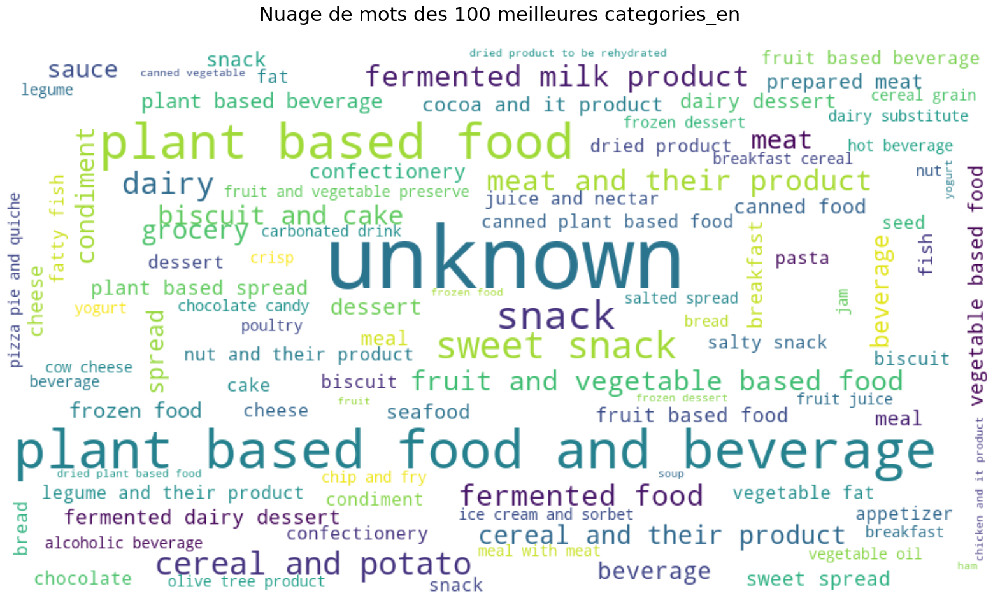

In [73]:
plot_world_cloud(df=datas,column="categories_en",nb_top=100)

Passons à présent aux variables `pnns_groups_1` et `pnns_groups_2` qui nous apporteront des informations plus précises :

In [74]:
pnns_groups_1 = split_words(df = datas, column = 'pnns_groups_1')
pnns_groups_2 = split_words(df = datas, column = 'pnns_groups_2')
print("{} catégories sont représentées dans la variable pnns_group_1.".format(len(pnns_groups_1)))
print("{} catégories sont représentées dans la variable pnns_group_2.".format(len(pnns_groups_2)))

11 catégories sont représentées dans la variable pnns_group_1.
40 catégories sont représentées dans la variable pnns_group_2.


In [75]:
pnns_groups_1

['composite food',
 'fish meat egg',
 'milk and dairy product',
 'beverage',
 'salty snack',
 'sugary snack',
 'fat and sauce',
 'cereal and potato',
 'alcoholic beverage',
 'unknown',
 'fruit and vegetable']

In [77]:
pnns_groups_1 = split_words(df = datas, column = 'pnns_groups_1')
print("{} catégories sont représentées dans la variable pnns_group_1.".format(len(pnns_groups_1)))
print(pnns_groups_1)

11 catégories sont représentées dans la variable pnns_group_1.
['composite food', 'fish meat egg', 'milk and dairy product', 'beverage', 'salty snack', 'sugary snack', 'fat and sauce', 'cereal and potato', 'alcoholic beverage', 'unknown', 'fruit and vegetable']


In [78]:
pnns_groups_2

['offal',
 'pizza pie and quiche',
 'pastry',
 'tea and herbal tea and coffee',
 'vegetable',
 'fruit nectar',
 'bread',
 'water and flavored water',
 'unsweetened beverage',
 'dried fruit',
 'dressing and sauce',
 'cheese',
 'chocolate product',
 'biscuit and cake',
 'cereal',
 'dairy dessert',
 'meat',
 'sweet',
 'soup',
 'plant based milk substitute',
 'sandwich',
 'sweetened beverage',
 'fat',
 'ice cream',
 'milk and yogurt',
 'processed meat',
 'alcoholic beverage',
 'fruit juice',
 'legume',
 'nut',
 'fruit',
 'salty and fatty product',
 'artificially sweetened beverage',
 'breakfast cereal',
 'fish and seafood',
 'potato',
 'unknown',
 'one dish meal',
 'appetizer',
 'egg']

In [83]:
pnns_groups_2 = split_words(df = datas, column = 'pnns_groups_2')
print("{} catégories sont représentées dans la variable pnns_group_2.".format(len(pnns_groups_2)))

40 catégories sont représentées dans la variable pnns_group_2.


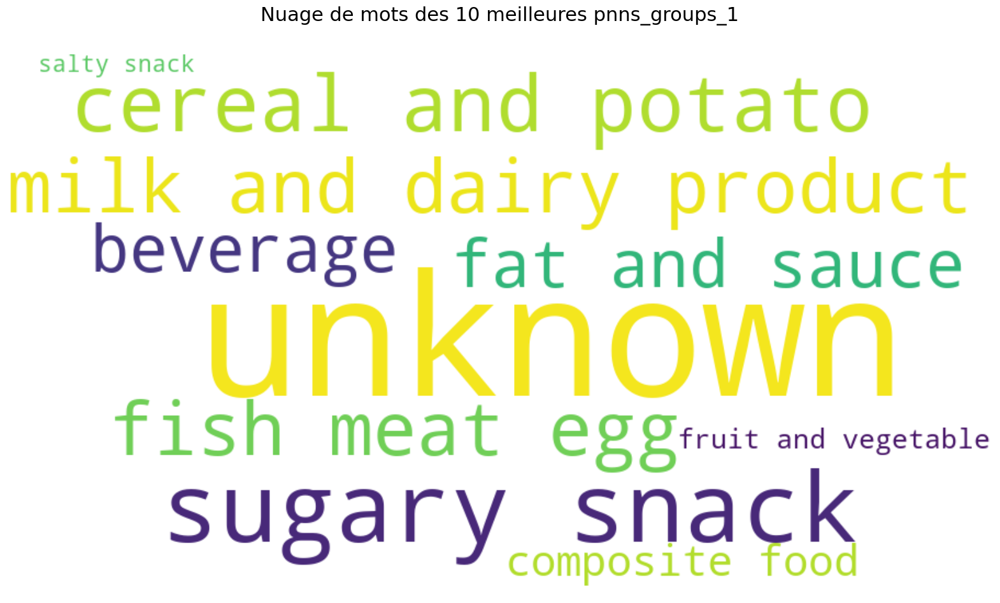

In [84]:
plot_world_cloud(df=datas,column="pnns_groups_1",nb_top=10)

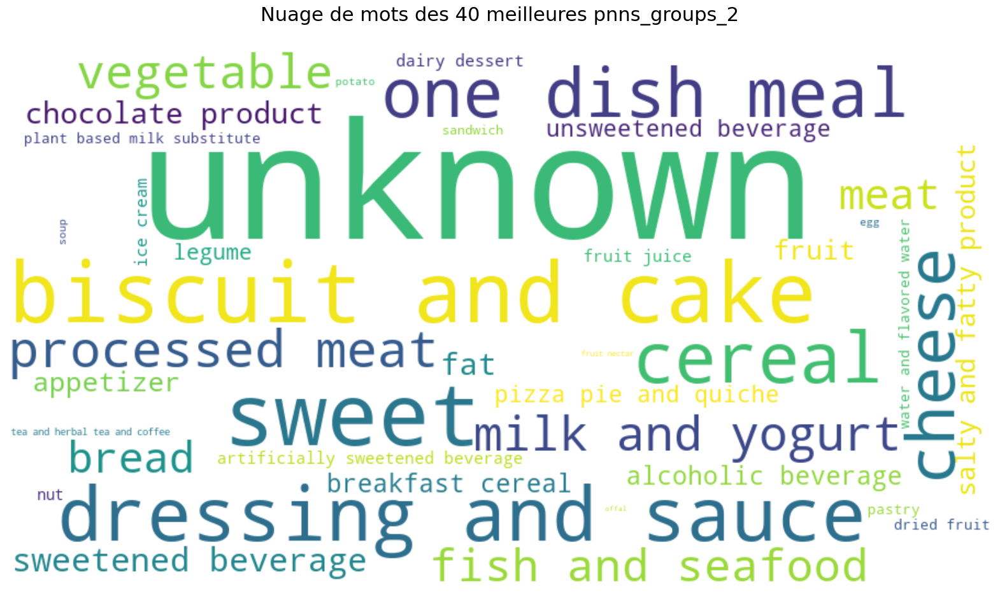

In [85]:
plot_world_cloud(df=datas,column="pnns_groups_2",nb_top=len(pnns_groups_2))

In [86]:
datas.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1877499 entries, 1 to 2830754
Columns: 165 entries, code to carnitine_100g
dtypes: float64(124), object(41)
memory usage: 2.3+ GB


### <font color="#ea1c60" id="section_5">Packaging</font>

In [87]:
datas['packaging_en'] = datas['packaging_en'].apply(lemmatize_and_remove_prefix)

In [88]:
packaging_en = split_words(df = datas, column = 'packaging_en')
print("{} catégories sont représentées dans la variable packaging_en.".format(len(packaging_en)))

datas['packaging_en'] = np.where((datas['packaging_en'].isnull()==True), "unknown", 
                                 np.where(datas['packaging_en'] == "", "unknown", datas['packaging_en']))

23059 catégories sont représentées dans la variable packaging_en.


In [89]:
df_top_packaging = pd.DataFrame(top_words(df=datas, column="packaging_en", nb_top=10), 
                                 columns=["Keyword","count"])
df_top_packaging

,Keyword,count
0,unknown,1566203
1,plastic,74098
2,plastic,38376
3,metal,15012
4,cardboard,14032
5,glass,13687
6,bag,12263
7,cardboard,11384
8,glass,9960
9,bottle,8629


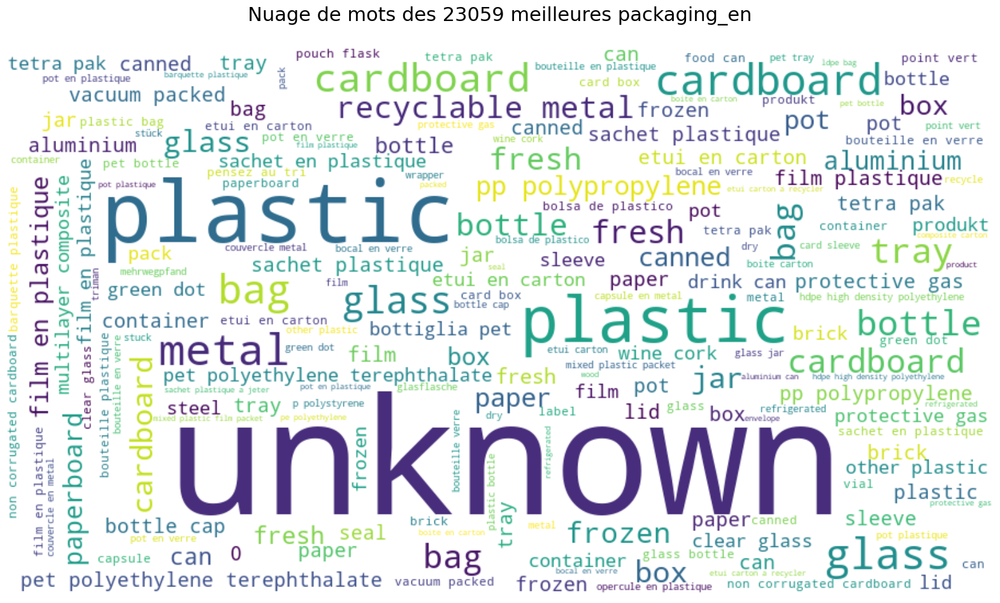

In [90]:
plot_world_cloud(df=datas,column="packaging_en",nb_top=len(packaging_en))

### <font color="#ea1c60" id="section_5">1.5. Compléter les valeurs manquantes ou aberrantes</font>

Le jeu de données est nettoyé mais comme le montre les informations ci-dessus, il reste un grand nombre de valeurs manquantes qu'il va falloir compléter mais également des outliers à identifier.

Regardons dans un premier temps une rapide description du Dataset :

In [113]:
datas.describe()

,serving_quantity,additives_n,nutriscore_score,nova_group,ecoscore_score,product_quantity,unique_scans_n,completeness,energy-kj_100g,energy-kcal_100g,...,carbon-footprint-from-meat-or-fish_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,choline_100g,phylloquinone_100g,beta-glucan_100g,inositol_100g,carnitine_100g
count,4.989590e+05,723316.000000,753230.000000,641173.000000,479401.00000,5.435820e+05,649343.000000,1.877497e+06,1.871710e+05,1.723938e+06,...,11727.000000,753233.000000,3.000000,6.000000,1.000,96.000000,1344.000000,52.000000,80.000000,46.000000
mean,2.449814e+28,1.958678,9.192364,3.391380,48.90237,1.655708e+13,2.546171,4.802570e-01,3.644603e+03,3.043754e+39,...,608.323594,9.192389,18.666667,40.950000,1.475,6.891693,0.087756,3.506346,1.921747,0.024343
std,1.730476e+31,2.827394,8.679002,0.986667,25.31537,1.220703e+16,6.794489,2.018555e-01,1.054156e+06,3.996413e+42,...,6118.394023,8.678998,6.027714,18.779111,NaN,43.472295,2.061522,2.775687,11.776487,0.083090
min,0.000000e+00,0.000000,-15.000000,1.000000,-30.00000,0.000000e+00,1.000000,1.000000e-01,0.000000e+00,-5.300000e+01,...,0.049000,-15.000000,13.000000,14.000000,1.475,0.000000,0.000000,0.400000,0.001600,0.000800
25%,2.800000e+01,0.000000,2.000000,3.000000,30.00000,1.500000e+02,1.000000,3.000000e-01,3.930000e+02,1.000000e+02,...,102.075000,2.000000,15.500000,32.250000,1.475,0.039025,0.000008,2.275000,0.008775,0.007000
50%,5.600000e+01,1.000000,10.000000,4.000000,49.00000,2.800000e+02,1.000000,4.000000e-01,9.900000e+02,2.590000e+02,...,310.800000,10.000000,18.000000,41.500000,1.475,0.083000,0.000024,3.600000,0.024500,0.011000
75%,1.180000e+02,3.000000,16.000000,4.000000,72.00000,5.000000e+02,2.000000,5.750000e-01,1.620000e+03,4.000000e+02,...,606.800000,16.000000,21.500000,47.525000,1.475,0.122500,0.000103,4.000000,0.051000,0.015000
max,1.222357e+34,50.000000,40.000000,4.000000,125.00000,9.000000e+18,842.000000,1.100000e+00,4.555600e+08,5.247243e+45,...,656298.600000,40.000000,25.000000,70.000000,1.475,390.000000,54.000000,20.000000,75.000000,0.572000


On remarque déjà que les valeurs minimum et maximum de **certaines variables** (comme les nutriments ou la valeur energetique) **peuvent contenir des valeurs aberrantes**, ce qui impacte également l'écart-type et donc la variance.

Nous allons **supprimer tous les produits qui n'ont ni nom, ni catégorie** et qui ne pourront donc être clairement identifiés.

In [114]:
datas_cleaned = datas[~((datas.product_name.isnull()) 
                        & ((datas.pnns_groups_1 == "unknown") 
                           | (datas.main_category_en == "unknown")))]

In [115]:
datas_cleaned[((datas_cleaned.pnns_groups_1 == "unknown") & (datas_cleaned.main_category_en == "unknown") &
              (datas_cleaned.pnns_groups_2 == "unknown") & (datas_cleaned.categories_en == "unknown"))].shape[0]

957514

Il reste tout de même **957514 qui ne contiennent aucune indication de catégorie**.

Afin de pouvoir calculer des indicateurs empiriques correctes, nous allons supprimer tous les max et min aberrants *(0, -1 ou 999999...)* :

In [116]:
#On repère les numerical_features
numerical_features = list(datas_cleaned.select_dtypes(include=["float64","int64"]).columns)
#On supprime les nutriscores qui eux peuvent être négatifs
numerical_features.remove('nutriscore_score')
numerical_features.remove('nutrition-score-fr_100g')
numerical_features.remove('nutrition-score-uk_100g')
numerical_features.remove('nova_group')

In [117]:
#On supprime les lignes dont toutes les numerical_features sont à 0 ou nulles
#datas_cleaned = datas_cleaned.loc[~((datas_cleaned[numerical_features]==0) | (datas_cleaned[numerical_features].isnull())).all(axis=1)]

In [118]:
#On supprime les lignes contenant des valeurs négatives et des max aberrants
datas_cleaned = datas_cleaned[~(datas_cleaned[numerical_features] < 0).any(axis=1)]
datas_cleaned = datas_cleaned[~(datas_cleaned[numerical_features].isin([999999,9999999])).any(axis=1)]

Les variables suffixées avec `_100g` nous indiquent la quantité de nutriment pour 100 grammes de produit. Les valeurs renseignées ne peuvent donc logiquement pas excéder 100. Nous allons donc **supprimer les lignes dont au moins 1 des variables de nutriments est supérieur au seuil** :

In [119]:
#On repère les g_per_100g_features
g_per_100g_features = list(datas_cleaned.filter(regex='_100g$').columns)
#On supprime les features ayant des unités différentes des g
g_per_100g_features.remove('energy-kj_100g')
g_per_100g_features.remove('energy-kcal_100g')
g_per_100g_features.remove('energy_100g')
g_per_100g_features.remove('energy-from-fat_100g')
g_per_100g_features.remove('ph_100g')
g_per_100g_features.remove('carbon-footprint_100g')
g_per_100g_features.remove('carbon-footprint-from-meat-or-fish_100g')
g_per_100g_features.remove('nutrition-score-fr_100g')
g_per_100g_features.remove('nutrition-score-uk_100g')

In [120]:
datas_cleaned = datas_cleaned[~(datas_cleaned[g_per_100g_features] > 100).any(axis=1)]

D'autre part, les valeurs de `saturated-fat_100g` ne peuvent pas être supérieurs à `fat_100g`, de même pour les valeurs de `sodium_100g` qui ne peuvent pas être supérieurs à `salt_100g`, de même pour le sucre ajoutée avec le sucre, le sucre avec les glucides.     
Nous allons donc supprimer les lignes qui remplissent ces conditions :

In [121]:
datas_cleaned = datas_cleaned[~((datas_cleaned['saturated-fat_100g'] > datas_cleaned['fat_100g']) 
                                | (datas_cleaned['sodium_100g'] > datas_cleaned['salt_100g'])
                                | (datas_cleaned['added-sugars_100g'] > datas_cleaned['sugars_100g'])
                                | (datas_cleaned['sugars_100g'] > datas_cleaned['carbohydrates_100g'])
                               )]

Enfin, les densité d'energie maximales pour 100g sont de 3700 kJ/100g *(source [Wikipedia](https://en.wikipedia.org/wiki/Food_energy))*. Nous allons donc supprimer toutes les lignes dont la variable `energy_100g` est supérieur à 3700 *(ou 900 kcal/100g)*. Et le ph se situant entre 0 et 14.

In [122]:
datas_cleaned = datas_cleaned[~((datas_cleaned['energy_100g'] > 3700) 
                                | (datas_cleaned['energy-kj_100g'] > 3700) 
                                | (datas_cleaned['energy-from-fat_100g'] > 3700) 
                                | (datas_cleaned['energy-kcal_100g'] > 900)
                                | (datas_cleaned['ph_100g'] < 0) | (datas_cleaned['ph_100g'] > 14)
                               )]

Pour les variables restantes, nous allons nous baser sur la médiane et l'écart-type pour éliminer les outliers. Commençons par afficher la dispersion des données et ces métriques :

In [123]:
sigma_features = ['additives_n','serving_quantity','product_quantity']

In [124]:
#On initialise l'écart-type et la médiane
sigma = [0 for _ in range(len(sigma_features))]
median = [0 for _ in range(len(sigma_features))]
#Puis on complètes les valeurs avec le dataset sans les valeurs nulles
for i in range(len(sigma_features)):
  median[i] = datas_cleaned[pd.notnull(datas_cleaned[sigma_features[i]])][sigma_features[i]].median()
  serie = datas_cleaned[pd.notnull(datas_cleaned[sigma_features[i]])][sigma_features[i]]
  serie = serie.sort_values()
  sigma[i] = np.std(serie[:-25])

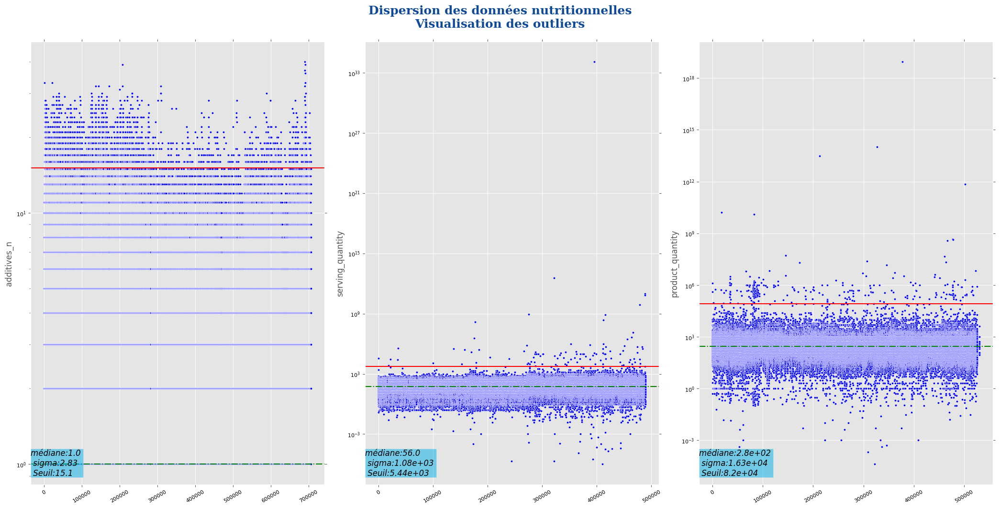

In [125]:
plt.style.use('ggplot')
tPlot, axes = plt.subplots(nrows=1, ncols=3, sharex=False, sharey=False, figsize=(21,10))
axes = np.array(axes).flatten() # flatten pour avoir un tableau à 1 dimension

i = 0
for ax in axes:
    colonne = sigma_features[i]
    test = datas_cleaned[pd.notnull(datas_cleaned[colonne])][colonne]
    ax.tick_params(labelcolor='black',top='off',bottom='on',left='on',right='off',labelsize=8)
    ax.set_ylabel(colonne.rstrip("_100g"), fontsize = 12)
    ax.set_yscale("log")
    ax.plot(list(test), 'b.', markeredgewidth = 0.3, markeredgecolor='w')
    for tick in ax.get_xticklabels():
        tick.set_rotation(30)
    ax.axhline(y=median[i], color='g', linestyle='dashdot')
    ax.axhline(y=median[i] + 5*sigma[i], color='r', linestyle='-')
    ax.text(0., 0.02, 'médiane:{:.3} \n sigma:{:.3} \n Seuil:{:.3}'.format(median[i], sigma[i], (median[i] + 5*sigma[i])),
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    i += 1

tPlot.text(0.5, 1.01, r"Dispersion des données nutritionnelles" "\n" "Visualisation des outliers", ha='center', fontdict=font_title)
plt.tight_layout()


Ces représentations nous indiquent clairement les éventuels **outliers qui diffèrent de la valeur médiane de plus de 5 fois l'écart-type ($5\sigma$ - valeur sélectionnée après plusieurs essais)**.

In [126]:
for i in range(len(sigma_features)):
    col = sigma_features[i]
    threshold = (median[i] + 5*sigma[i])
    print('{:30}: suppression de la ligne si valeur > {}'.format(col, round(threshold,3)))
    mask = datas_cleaned[col] > threshold
    datas_cleaned = datas_cleaned.drop(datas_cleaned[mask].index)

additives_n                   : suppression de la ligne si valeur > 15.135
serving_quantity              : suppression de la ligne si valeur > 5440.734
product_quantity              : suppression de la ligne si valeur > 82016.658


In [127]:
datas_cleaned.shape

(1833614, 165)

In [128]:
datas_cleaned.describe()

,serving_quantity,additives_n,nutriscore_score,nova_group,ecoscore_score,product_quantity,unique_scans_n,completeness,energy-kj_100g,energy-kcal_100g,...,carbon-footprint-from-meat-or-fish_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,choline_100g,phylloquinone_100g,beta-glucan_100g,inositol_100g,carnitine_100g
count,486211.000000,703938.000000,734092.000000,623917.000000,462153.000000,529818.000000,632165.000000,1.833612e+06,181932.000000,1.687334e+06,...,11263.000000,734095.000000,2.000000,6.000000,1.000,92.000000,1332.000000,52.000000,76.000000,45.000000
mean,97.958883,1.897791,9.163460,3.397840,50.318007,425.707725,2.553188,4.804711e-01,1083.295716,2.670431e+02,...,584.098751,9.163487,15.500000,40.950000,1.475,0.211332,0.048006,3.506346,1.034707,0.024716
std,121.630429,2.602125,8.681766,0.982818,23.950378,928.416849,6.799259,2.015523e-01,776.967728,1.850259e+02,...,6228.285065,8.681761,3.535534,18.779111,NaN,0.648491,1.450112,2.775687,8.598639,0.083990
min,0.000000,0.000000,-15.000000,1.000000,0.000000,0.000000,1.000000,2.000000e-01,0.000000,0.000000e+00,...,0.049000,-15.000000,13.000000,14.000000,1.475,0.000000,0.000000,0.400000,0.001600,0.000800
25%,28.000000,0.000000,2.000000,3.000000,33.000000,150.000000,1.000000,3.000000e-01,394.000000,1.000000e+02,...,99.900000,2.000000,14.250000,32.250000,1.475,0.032575,0.000008,2.275000,0.006400,0.007000
50%,56.000000,1.000000,10.000000,4.000000,49.000000,280.000000,1.000000,4.000000e-01,992.000000,2.580000e+02,...,301.180000,10.000000,15.500000,41.500000,1.475,0.073500,0.000024,3.600000,0.024000,0.011000
75%,120.000000,3.000000,16.000000,4.000000,72.000000,500.000000,2.000000,5.750000e-01,1623.000000,3.980000e+02,...,592.000000,16.000000,16.750000,47.525000,1.475,0.116250,0.000103,4.000000,0.051000,0.015000
max,5000.000000,15.000000,40.000000,4.000000,125.000000,80000.000000,842.000000,1.100000e+00,3700.000000,9.000000e+02,...,656298.600000,40.000000,18.000000,70.000000,1.475,4.550000,51.600000,20.000000,75.000000,0.572000


In [89]:
datas_cleaned.to_csv("datas_1_5.csv", sep='\t', encoding='utf-8', index=False)

In [4]:
from data_loader import read_config, get_data

datas_1_5 = get_data(file_path = "../data/datas_1_5.csv")
print(f"data set shape is {datas_1_5.shape}")

Reading dataset ...
data set shape is (1833614, 165)


In [5]:
datas_cleaned = datas_1_5

Après ces quelques opérations de nettoyage, les valeurs médianes, d'écarts-type, de minimum et maximum sont plus cohérentes. Nous allons pouvoir exploiter ces données pour **estimer les valeurs manquantes**.

Nous allons déjà regarder la **distribution de ces variables et définir si elles suivent une loi normale**, ce qui nous aidera à prendre une décision pour la méthode d'imputation des valeurs manquantes.

In [129]:
#On repère à nouveau les numerical_features (toutes cette fois-ci)
numerical_features = list(datas_cleaned.select_dtypes(include=["float64","int64"]).columns)

In [130]:
font_title = {'family': 'serif',
              'color':  '#114b98',
              'weight': 'bold',
              'size': 18,
             }

In [131]:
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
fig = plt.figure(figsize=(30,350))

num_features = len(numerical_features)
num_rows = num_features // 3 + (num_features % 3 > 0) # Calcul du nombre de rangées nécessaires
num_cols = 3 # Fixer le nombre de colonnes à 3

sub = 0
for i in range(num_features):
    fig.add_subplot(num_rows, num_cols, i+1)
    
    left, width = 0, 1
    bottom, height = 0, 1
    right = left + width
    top = bottom + height
    
    colonne = numerical_features[i]
    kstest = stats.kstest(datas_cleaned[colonne].notnull(),'norm')
    ax = sns.distplot(datas_cleaned[colonne], fit=stats.norm, kde=False)
    ax.set_title("Distribution vs loi normale : {}".format(colonne))
    ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    sub += 1
plt.show()


ValueError: `dataset` input should have multiple elements.

En se basant sur les projections obtenus et les résultats des tests de Kolmogorov-Smirnov (Pvalue < au niveau de test de 5%) **on rejette donc l'hypothèse de normalité des distributions de ces variables**. Il serait donc inexacte d'imputer les valeurs manquantes par la moyenne.

Pour confirmer cette approche, regardons à présent quelque unes de ces distributions en fonction de la catégorie `pnns_groups_1` :

In [132]:
import math

plt.style.use('ggplot')
fig = plt.figure(figsize=(30,300))

num_vars = len(numerical_features)
num_cols = 2
num_rows = math.ceil(num_vars / num_cols)

sub = 0
for i in range(num_vars):
    fig.add_subplot(num_rows, num_cols, i+1)
    colonne = numerical_features[i]
    ax = sns.boxplot(x="pnns_groups_1", y=colonne, data=datas_cleaned[datas_cleaned["pnns_groups_1"]!="unknown"])
    for tick in ax.get_xticklabels():
        tick.set_rotation(30)
    sub += 1

fig.text(0.5, 0.90, r"Distribution des variables nutritionnelles" "\n" "par catégories pnns_groups_1", ha="center", 
         fontdict=font_title)
plt.show()


Si l'on regarde la distribution de quelques unes de ces mêmes variables sur la catégorie `pnns_groups_2` :

In [ ]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(21, 5*len(numerical_features)))

sub = 0
for i in range(len(numerical_features)):
    fig.add_subplot(len(numerical_features), 1, i+1)
    colonne = numerical_features[i]
    ax = sns.boxplot(y="pnns_groups_2", x=colonne, data=datas_cleaned[datas_cleaned["pnns_groups_2"]!="unknown"])
    for tick in ax.get_xticklabels():
        tick.set_rotation(30)
    sub += 1

fig.text(0.5, 0.90, r"Distribution des variables nutritionnelles" "\n" "par catégories pnns_groups_2", ha="center", 
         fontdict=font_title)
plt.show()


In [134]:
datas_cleaned[numerical_features].isnull().sum()

serving_quantity      1347403
additives_n           1129676
nutriscore_score      1099522
nova_group            1209697
ecoscore_score        1371461
                       ...   
choline_100g          1833522
phylloquinone_100g    1832282
beta-glucan_100g      1833562
inositol_100g         1833538
carnitine_100g        1833569
Length: 124, dtype: int64

In [135]:
def null_factor(df, tx_threshold=50):
  null_rate = ((datas_cleaned.isnull().sum() / datas_cleaned.shape[0])*100).sort_values(ascending=False).reset_index()
  null_rate.columns = ['Variable','Taux_de_Null']
  high_null_rate = null_rate[null_rate.Taux_de_Null >= tx_threshold]
  return high_null_rate

In [136]:
full_null_rate_datas_cleaned = null_factor(datas_cleaned, 100)
full_null_rate_datas_cleaned

,Variable,Taux_de_Null


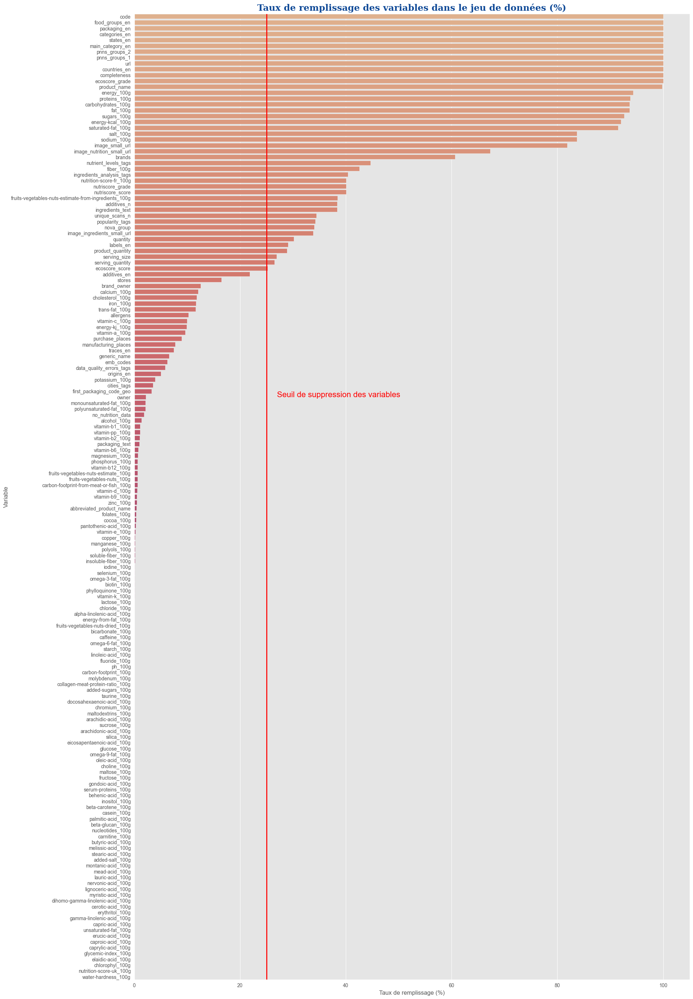

In [137]:
filling_features = null_factor(datas_cleaned, 0)
filling_features["Taux_de_Null"] = 100-filling_features["Taux_de_Null"]
filling_features = filling_features.sort_values("Taux_de_Null", ascending=False) 

#Seuil de suppression
sup_threshold = 25

fig = plt.figure(figsize=(20, 35))

font_title = {'family': 'serif',
              'color':  '#114b98',
              'weight': 'bold',
              'size': 18,
             }

sns.barplot(x="Taux_de_Null", y="Variable", data=filling_features, palette="flare")
#Seuil pour suppression des varaibles
plt.axvline(x=sup_threshold, linewidth=2, color = 'r')
plt.text(sup_threshold+2, 65, 'Seuil de suppression des variables', fontsize = 16, color = 'r')

plt.title("Taux de remplissage des variables dans le jeu de données (%)", fontdict=font_title)
plt.xlabel("Taux de remplissage (%)")
plt.show()

In [138]:
datas_cleaned.shape

(1833614, 165)

Nous allons donc compléter les valeurs nulles par la **médiane de la catégorie** `pnns_groups_2`, même si certaines variables sont très peu renseignées.

In [139]:
numerical_features

['serving_quantity',
 'additives_n',
 'nutriscore_score',
 'nova_group',
 'ecoscore_score',
 'product_quantity',
 'unique_scans_n',
 'completeness',
 'energy-kj_100g',
 'energy-kcal_100g',
 'energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'unsaturated-fat_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 

In [140]:
# On complète les variables avec la médiane du groupe pnns 2
for col in numerical_features:
    datas_cleaned[col] = datas_cleaned.groupby('pnns_groups_2')[col].transform(lambda x: x.fillna(x.median()))

In [141]:
pd.set_option('display.max_columns', None)  

In [142]:
datas_cleaned[numerical_features].isnull().sum()

serving_quantity           0
additives_n                0
nutriscore_score           0
nova_group                 0
ecoscore_score          6230
                       ...  
choline_100g          519857
phylloquinone_100g    167197
beta-glucan_100g      482566
inositol_100g         653793
carnitine_100g        653793
Length: 124, dtype: int64

In [143]:
# Certaines variables ont encore des null car n'ont peut-être pas de valeurs dans les groupe pnns 2
# On complète les variables avec la médiane du groupe pnns1
for col in numerical_features:
    datas_cleaned[col] = datas_cleaned.groupby('pnns_groups_1')[col].transform(lambda x: x.fillna(x.median()))

In [144]:
datas_cleaned[numerical_features].isnull().sum()

serving_quantity           0
additives_n                0
nutriscore_score           0
nova_group                 0
ecoscore_score             0
                       ...  
choline_100g          271791
phylloquinone_100g     12739
beta-glucan_100g      362257
inositol_100g         560270
carnitine_100g        560270
Length: 124, dtype: int64

In [145]:
# Certaines variables ont encore des null
# On complète les variables avec la médiane de la variable
for col in numerical_features:
    datas_cleaned[col] = datas_cleaned[col].transform(lambda x: x.fillna(x.median()))

In [146]:
datas_cleaned[numerical_features].isnull().sum()

serving_quantity      0
additives_n           0
nutriscore_score      0
nova_group            0
ecoscore_score        0
                     ..
choline_100g          0
phylloquinone_100g    0
beta-glucan_100g      0
inositol_100g         0
carnitine_100g        0
Length: 124, dtype: int64

In [147]:
datas_cleaned.shape

(1833614, 165)

Les valeurs manquantes étant à présent toutes complétées pour ces variables numériques, nous allons vérifier que les distributions n'ont pas changées :

In [148]:
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
fig = plt.figure(figsize=(30,350))

num_features = len(numerical_features)
num_rows = num_features // 3 + (num_features % 3 > 0) # Calcul du nombre de rangées nécessaires
num_cols = 3 # Fixer le nombre de colonnes à 3

sub = 0
for i in range(num_features):
    fig.add_subplot(num_rows, num_cols, i+1)
    
    left, width = 0, 1
    bottom, height = 0, 1
    right = left + width
    top = bottom + height
    
    colonne = numerical_features[i]
    kstest = stats.kstest(datas_cleaned[colonne].notnull(),'norm')
    ax = sns.distplot(datas_cleaned[colonne], fit=stats.norm, kde=False)
    ax.set_title("Distribution vs loi normale : {}".format(colonne))
    ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    sub += 1
plt.show()


Les variables qui semblent les plus pertinentes et dont il y avait le moins de null (['serving_quantity','energy_100g','energy-kcal_100g','proteins_100g','saturated-fat_100g','sugars_100g','salt_100g'] n'ont pas vu leur distribution changer énormément. D'autres un peu plus mais il s'agit grandement des variables avec initialement beaucoup de null.

### <font color="#ea1c60" id="section_6">1.6. Calcul des Nutri-Scores manquants</font>

Une des variables primoridale de ce jeu de données est le Nutriscore. Or, cette variable compte beaucoup de manquants. 
Afin de calculer ce nutriscore, nous avons besoin de plusieurs autres variables.

Le score prend en comptepour 100g de produit, la teneur :
- En nutriments et aliments à favoriser (fibres, protéines, fruits et légumes),
- En nutriments à limiter (énergie, acide gras saturés, sucres, sel).

Après calcul, le score obtenu par un produit permet de lui attribuer une lettre et une couleur.
Voici un tableau simplifié permettant de calculer l'attribution des points :

<table width="100%" style="border:solid 1px; text-align:center;" align="center">
    <thead style="border:solid 1px; text-align:center;">
        <th bgcolor="#feadb3"><b>Points</b></th>
        <th bgcolor="#feadb3">Energie (kJ)</th>
        <th bgcolor="#feadb3">Sucres simples (g)</th>
        <th bgcolor="#feadb3">Acide gras saturés (g)</th>
        <th bgcolor="#feadb3">Sodium (mg)</th>
        <th bgcolor="#b6faa3"><b>Points</b></th>
        <th bgcolor="#b6faa">Fruits,leg(%)</th>
        <th bgcolor="#b6faa">Fibres (g)</th>
        <th bgcolor="#b6faa">Protéines (g)</th>
    </thead>
    <tbody>
        <tr>
            <td bgcolor="#feadb3"><b>0</b></td>
            <td bgcolor="#feadb3">$\leq$ 335</td>
            <td bgcolor="#feadb3">$\leq$ 4,5</td>
            <td bgcolor="#feadb3">$\leq$ 1</td>
            <td bgcolor="#feadb3">$\leq$ 90</td>
            <td bgcolor="#b6faa"><b>0</b></td>
            <td bgcolor="#b6faa">$\leq$ 40</td>
            <td bgcolor="#b6faa">$\leq$ 0,7</td>
            <td bgcolor="#b6faa">$\leq$ 1,6</td>
        </tr>
        <tr>
            <td bgcolor="#feadb3"><b>5</b></td>
            <td bgcolor="#feadb3">$>$ 335</td>
            <td bgcolor="#feadb3">$>$ 4,5</td>
            <td bgcolor="#feadb3">$>$ 1</td>
            <td bgcolor="#feadb3">$>$ 90</td>
            <td bgcolor="#b6faa"><b>-2</b></td>
            <td bgcolor="#b6faa">$>$ 40</td>
            <td bgcolor="#b6faa">$>$ 0,7</td>
            <td bgcolor="#b6faa">$>$ 1,6</td>
        </tr>
        <tr>
            <td bgcolor="#feadb3"><b>10</b></td>
            <td bgcolor="#feadb3">$>$ 1675</td>
            <td bgcolor="#feadb3">$>$ 22,5</td>
            <td bgcolor="#feadb3">$>$ 5</td>
            <td bgcolor="#feadb3">$>$ 450</td>
            <td bgcolor="#b6faa"><b>-5</b></td>
            <td bgcolor="#b6faa">$>$ 80</td>
            <td bgcolor="#b6faa">$>$ 3,5</td>
            <td bgcolor="#b6faa">$>$ 8</td>
        </tr>
        <tr style="border:solid 1px; text-align:center;">
            <td> </td>
            <td>(a)</td>
            <td>(b)</td>
            <td>(c)</td>
            <td>(d)</td>
            <td> </td>
            <td>(e)</td>
            <td>(f)</td>
            <td>(g)</td>
        </tr>
        <tr>
            <td><b>Total</b></td>
            <td colspan="8"><b>(a) + (b) + (c) + (d) + (e) + (f) + (g)</b></td>
        </tr>
    </tbody>
</table>

Attribution des classes *(version simplifiée)* :

<table width="50%" style="border:solid 1px; text-align:center;" align="center">
    <thead>
        <th>Aliment solide</th>
        <th>Lettre</th>
        <th>Couleur</th>
    </thead>
    <tbody>
        <tr>
            <td>Mimimum -1</td>
            <td>A</td>
            <td>Vert foncé</td>
        </tr>
        <tr>
            <td>0 à 5</td>
            <td>B</td>
            <td>Vert</td>
        </tr>
        <tr>
            <td>5 à 10</td>
            <td>C</td>
            <td>Jaune</td>
        </tr>
        <tr>
            <td>10 à 20</td>
            <td>D</td>
            <td>Orange</td>
        </tr>
        <tr>
            <td>20 et plus</td>
            <td>E</td>
            <td>Orange foncé</td>
        </tr>
    </tbody>
</table>

Nous allons donc **isoler les variables nécessaires au calcul du Nutriscore et vérifier leur taux de remplissage** :

In [149]:
nutriscore_features = ['pnns_groups_1', 'pnns_groups_2', 'nutriscore_grade', 'nutriscore_score',
                       'energy_100g','sugars_100g','saturated-fat_100g','sodium_100g', 'fiber_100g', 'proteins_100g']
datas_cleaned[nutriscore_features].sample(10)

,pnns_groups_1,pnns_groups_2,nutriscore_grade,nutriscore_score,energy_100g,sugars_100g,saturated-fat_100g,sodium_100g,fiber_100g,proteins_100g
1942293,beverage,fruit juice,e,14.0,195.0,9.600000,0.00000,0.000000,0.6,0.700000
751674,unknown,unknown,NaN,10.0,736.0,21.296296,4.62963,0.055556,0.0,2.777778
776102,beverage,artificially sweetened beverage,e,11.0,146.0,9.000000,0.00000,0.000000,0.0,0.000000
2232574,cereal and potato,cereal,a,-1.0,1502.0,2.500000,0.50000,0.000000,3.5,13.000000
603259,unknown,unknown,NaN,10.0,1360.0,47.500000,0.00000,0.240000,0.0,5.000000
1661361,unknown,unknown,NaN,10.0,1527.0,4.600000,0.60000,1.000000,1.9,7.500000
1329170,fat and sauce,dressing and sauce,c,6.0,612.0,34.000000,0.00000,0.008000,0.5,1.000000
1712897,unknown,unknown,NaN,10.0,1766.0,16.299999,7.10000,0.240000,11.0,11.600000
2066670,unknown,unknown,NaN,10.0,1079.0,3.600000,1.60000,0.240000,1.9,6.000000
1244510,cereal and potato,legume,a,-2.0,1406.0,4.000000,0.30000,0.404000,24.9,21.100000


Nous allons donc tenter de d'estimer la proportion de fruit/légumes en fonction de la catégorie :

In [150]:
datas_cleaned.pnns_groups_2.unique()

array(['unknown', 'dressing and sauce', 'pizza pie and quiche', 'fruit',
       'one dish meal', 'sweetened beverage', 'meat', 'bread',
       'salty and fatty product', 'fruit juice', 'sweet', 'vegetable',
       'biscuit and cake', 'fat', 'dairy dessert', 'pastry',
       'dried fruit', 'legume', 'unsweetened beverage', 'nut', 'cereal',
       'alcoholic beverage', 'breakfast cereal', 'appetizer',
       'fish and seafood', 'processed meat', 'sandwich',
       'chocolate product', 'cheese', 'milk and yogurt',
       'plant based milk substitute', 'egg', 'ice cream',
       'tea and herbal tea and coffee', 'potato',
       'artificially sweetened beverage', 'soup',
       'water and flavored water', 'offal', 'fruit nectar'], dtype=object)

In [151]:
high_rate_fruit = ['fruit juices','dried fruits','legumes','vegetables','fruits', 'soups','potatoes','fruit nectars']

medium_rate_fruit = ['unknown', 'sweetened beverages', 'dressings and sauces', 'ice cream', 'pastries', 'dairy desserts',
                     'pizza pies and quiche', 'pizza pies and quiches']

low_rate_fruit = ['waters and flavored waters','chocolate products', 'fish and seafood', 'salty and fatty products', 
                  'cheese', 'cereals', 'appetizers', 'one dish meals', 'bread', 'fats', 'plant based milk substitutes',
                  'alcoholic beverages', 'processed meat', 'breakfast cereals', 'meat', 'eggs', 'sandwiches',
                  'offals', 'teas and herbal teas and coffees', 'biscuits and cakes', 'sweets', 'milk and yogurt',
                  'artificially sweetened beverages', 'unsweetened beverages','nuts']

In [152]:
datas_cleaned['fruits-vegetables-rate_100g'] = [81 if cat in high_rate_fruit else 45 if cat in medium_rate_fruit else 25 for cat in datas_cleaned.pnns_groups_2]

A présent, nous allons définir la **fonction de calcul du Nutriscore** et l'appliquer à notre dataset :

In [153]:
def calc_globalscore(row):
    #Energy
    if row["energy_100g"] <= 335:
        a = 0
    elif ((row["energy_100g"] > 335) & (row["energy_100g"] <= 1675)):
        a = 5
    else:
        a = 10 
    #Sugar
    if row["sugars_100g"] <= 4.5:
        b = 0
    elif ((row["sugars_100g"] > 4.5) & (row["sugars_100g"] <= 22.5)):
        b = 5
    else:
        b = 10
    #saturated-fat
    if row["saturated-fat_100g"] <= 1:
        c = 0
    elif ((row["saturated-fat_100g"] > 1) & (row["saturated-fat_100g"] <= 5)):
        c = 5
    else:
        c = 10
    #sodium
    if (row["sodium_100g"]/1000) <= 90:
        d = 0
    elif (((row["sodium_100g"]/1000) > 90) & ((row["sodium_100g"]/1000) <= 450)):
        d = 5
    else:
        d = 10
    #fruits-vegetables-rate
    if row["fruits-vegetables-rate_100g"] <= 40:
        e = 0
    elif ((row["fruits-vegetables-rate_100g"] > 40) & (row["fruits-vegetables-rate_100g"] <= 80)):
        e = -2
    else:
        e = -5
    #fiber
    if row["fiber_100g"] <= 0.7:
        f = 0
    elif ((row["fiber_100g"] > 0.7) & (row["fiber_100g"] <= 3.5)):
        f = -2
    else:
        f = -5
    #proteins
    if row["proteins_100g"] <= 1.6:
        g = 0
    elif ((row["proteins_100g"] > 1.6) & (row["proteins_100g"] <= 8)):
        g = -2
    else:
        g = -5
    
    #Global_score
    global_score = a+b+c+d+e+f+g
    
    return global_score

In [154]:
#Nutriscore
def calc_nutriscore(row):
    if row["calc_global_score"] < 0 :
        nutriscore = "a"
    elif ((row["calc_global_score"] >= 0) & (row["calc_global_score"] < 5)) :
        nutriscore = "b"
    elif ((row["calc_global_score"] >= 5) & (row["calc_global_score"] < 10)) :
        nutriscore = "c"
    elif ((row["calc_global_score"] >= 10) & (row["calc_global_score"] < 20)) :
        nutriscore = "d"
    else:
        nutriscore = "e"
        
    return nutriscore

In [155]:
datas_cleaned['calc_global_score'] = datas_cleaned.apply(lambda row: calc_globalscore(row),axis=1)
datas_cleaned['calc_nutriscore'] = datas_cleaned.apply(lambda row: calc_nutriscore(row),axis=1)

In [156]:
nutriscore_features.append('calc_global_score')
nutriscore_features.append('calc_nutriscore')

In [157]:
datas_cleaned[nutriscore_features].sample(10)

,pnns_groups_1,pnns_groups_2,nutriscore_grade,nutriscore_score,energy_100g,sugars_100g,saturated-fat_100g,sodium_100g,fiber_100g,proteins_100g,calc_global_score,calc_nutriscore
1782607,milk and dairy product,cheese,d,13.0,1226.0,0.6,14.3,0.520,0.00,25.2,10,d
1413181,unknown,unknown,NaN,10.0,2017.0,52.4,10.6,0.000,1.90,0.7,26,e
2463062,unknown,unknown,NaN,10.0,42.0,0.0,0.0,0.400,1.00,24.0,-9,a
1616569,sugary snack,chocolate product,e,19.0,2466.0,11.0,32.0,0.008,5.00,9.7,15,d
1226595,unknown,unknown,NaN,10.0,1439.0,1.2,22.0,0.560,1.90,15.0,6,c
2638288,sugary snack,sweet,d,12.0,894.0,50.0,0.0,0.000,0.94,0.8,13,d
382433,unknown,unknown,NaN,10.0,1079.0,3.6,1.6,0.240,1.90,6.0,4,b
2746921,unknown,unknown,c,3.0,393.0,0.9,1.1,0.280,1.90,3.8,4,b
1709783,unknown,unknown,NaN,10.0,1485.0,21.4,7.2,3.132,1.90,19.7,11,d
2255401,unknown,unknown,NaN,10.0,695.0,39.0,0.0,0.240,1.90,0.9,11,d


Nous devons à présent **vérifier les erreurs d'imputation sur les scores déjà connus**, ce qui nous permettra de voir si les calculs sont satisfaisants et utilisables :

In [158]:
df_scores = datas_cleaned[['nutriscore_grade', 'nutriscore_score', 'calc_nutriscore', 'calc_global_score']][datas_cleaned['nutriscore_grade'].isnull()==False]

from sklearn.metrics import accuracy_score

accuracy_nutrigrade = accuracy_score(df_scores['nutriscore_grade'].values, df_scores['calc_nutriscore'].values)
print("L'accuracy_score sur les Nutrigrades calculés est de : {:.2f} %.".format(accuracy_nutrigrade*100))

L'accuracy_score sur les Nutrigrades calculés est de : 48.37 %.


La précision du calul est donc inférieure à 50%. **Ces calculs ne peuvent donc pas être utilisés pour compléter nos données**.     **<font color="green">Notre application aura donc pour but d'éstimer le nutrigrade d'un produit en fonction de ses caractéristiques connues, comme la catégorie, sa teneur en nutriments ... grâce à des algorithmes simples de Machine Learning</font>**. 

In [159]:
datas_cleaned.drop(['calc_nutriscore','calc_global_score'], axis=1, inplace=True)

Nous avons 'nutriscore_score' qui est le score quantitatif du nutriscore. Nous pouvons imputer le grade selon le score.

In [160]:
def get_nutriscore_grade(score):
    if score is None:
        return None
    elif -15 <= score <= -1:
        return 'a'
    elif 0 <= score <= 2:
        return 'b'
    elif 3 <= score <= 10:
        return 'c'
    elif 11 <= score <= 18:
        return 'd'
    elif 19 <= score <= 40:
        return 'e'
    else:
        return None

datas_cleaned['nutriscore_grade'] = datas_cleaned.apply(lambda x: get_nutriscore_grade(x['nutriscore_score']) if pd.isna(x['nutriscore_grade']) else x['nutriscore_grade'], axis=1)

### <font color="#ea1c60" id="section_6">1.7. Les variables non numériques</font>

A ce stade, il reste des variables non numériques à nettoyer.

In [164]:
datas_cleaned.to_csv("datas_reste_non_num_a_traiter2.csv", sep='\t', encoding='utf-8', index=False)

**Voir comment traiter les colonnes non numériques qui comportent beaucoup de null.** A ce stade, nous avons seulement gardé les features catégorielles et numériques qui nous semblent pertinentes pour tester un clustering.